In [ ]:
!pip install -q mtcnn

In [ ]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import os
import random

from tqdm import tqdm_notebook as tqdm
tqdm().pandas()

from PIL import Image
import matplotlib.pyplot as plt

from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import Normalizer
from sklearn.svm import SVC

from mtcnn.mtcnn import MTCNN

0it [00:00, ?it/s]

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
ALT_PATH = '/content/drive/MyDrive/CS256_Dataset/Football_Images/Images/'


ALL_PATH = '/content/drive/MyDrive/CS256_Dataset/Football_Images/'

# Visualising the data

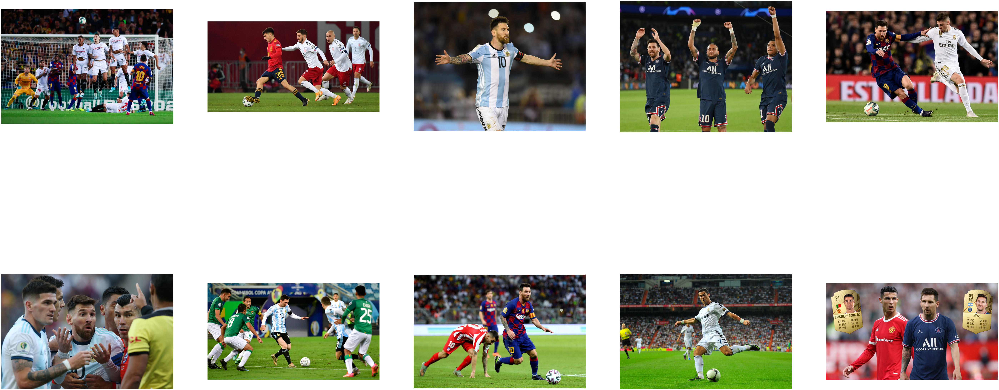

In [ ]:
plt.figure(figsize=(100,50))
for i, filename in enumerate(os.listdir(ALT_PATH)):

    if i < 10:
        path = ALT_PATH + filename
        image = plt.imread(path)
    
        plt.subplot(2, 5, i+1)
    
        plt.axis('off')
        plt.imshow(image)
    
plt.show()

# Detecting faces and cropping them out using MtCNN (Multi Task Cascaded CNN)

An MT CNN network is a cascading style neural network, which is formed out of 3 smaller networks called P-net, R-net and O-net.
MT Cnn is suggested by creators of facenet for zoning in on faces for training

0it [00:00, ?it/s]

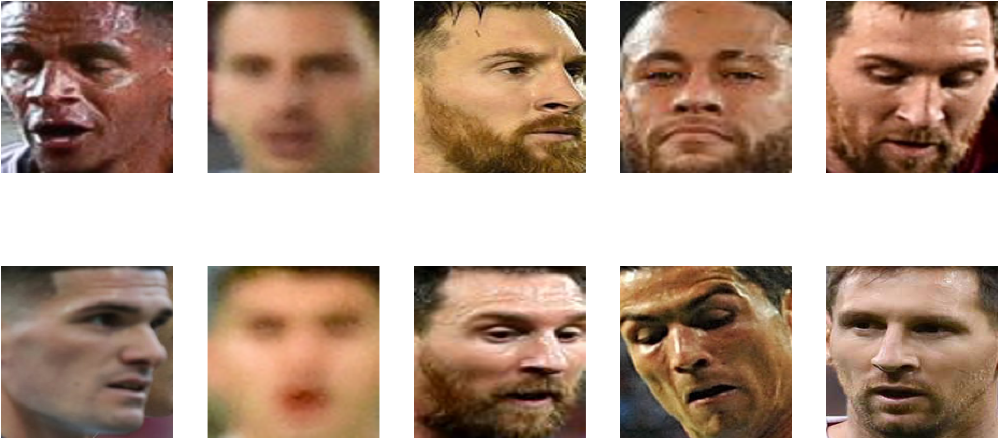

In [ ]:
# extract a single face from a given photograph
def extract_face(filename, required_size=(160, 160)):
    image = Image.open(filename)
    image = image.convert('RGB')
    pixels = np.asarray(image)
    
    face_arrays = list()

    detector = MTCNN()
    results = detector.detect_faces(pixels)
    
    for result in results:
        # extract the bounding box from the first face
        x1, y1, width, height = result['box']
        # bug fix
        x1, y1 = abs(x1), abs(y1)
        
        x2, y2 = x1 + width, y1 + height
        
        face = pixels[y1:y2, x1:x2]
        
        image = Image.fromarray(face)
        
        image = image.resize(required_size)
        face_array = np.asarray(image)
        face_arrays.append(face_array)
    
    return face_arrays

plt.figure(figsize=(100,50))
for i, filename in tqdm(enumerate(os.listdir(ALT_PATH))):
    
    if i < 10:
        path = ALT_PATH + filename
        
        face = extract_face(path)
        
        #print(i+1, face.shape)
        
        plt.subplot(2, 5, i+1)
        
        plt.axis('off')
        plt.imshow(face[0])
    
plt.show()

# Loading the dataset

In [ ]:
def load_faces(directory):
    faces = list()
    for file_name in tqdm(os.listdir(directory)):
        path = directory + file_name
        face = extract_face(path)
        
        faces.extend(face)
    return faces

def load_dataset(directory):
    images, labels = list(), list()
    for folder in tqdm(os.listdir(directory)):
        path = directory + folder + '/'
        
        if not os.path.isdir(path):
            continue
        
        faces = load_faces(path)

        print(f'Celebrity : {folder}, Faces : {len(faces)}')

        label = [folder for _ in range(len(faces))]

        images.extend(faces)
        labels.extend(label)
        
    return np.asarray(images), np.asarray(labels)

In [ ]:
X_train, y_train = load_dataset(ALL_PATH)

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

Celebrity : Images, Faces : 170


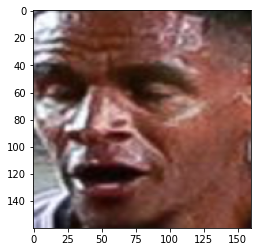

In [ ]:
plt.imshow(X_train[0])

In [ ]:
X_train[0].shape

(160, 160, 3)

In [ ]:
face_pixels = X_train[0]

print(face_pixels.shape)

face_pixels = np.expand_dims(face_pixels, axis=0)
print(face_pixels.shape)

(160, 160, 3)
(1, 160, 160, 3)


# Getting embeddings
We are using a pre trained facenet which is trained on MS-CELEB-1M dataset : https://exposing.ai/msceleb/


---



This training was made open source here: https://github.com/barisgecer/facenet



---

The backbone network for this facenet is inception-resnet-v1 : https://github.com/davidsandberg/facenet/blob/master/src/models/inception_resnet_v1.py

---

There are other pretrained models available as well over following datasets: 
---
VGGFace2 : https://github.com/ox-vgg/vgg_face2
---
CASIA-WebFace : https://paperswithcode.com/dataset/casia-webface#:~:text=The%20CASIA%2DWebFace%20dataset%20is,Mask%20using%20Multi%2Dscale%20GANs

In [ ]:
from keras.models import load_model

def get_embedding(model, face_pixels):
    face_pixels = face_pixels.astype('float32')
    
    # standardize pixel values across channels (global) 
    mean, std = face_pixels.mean(), face_pixels.std() 
    face_pixels = (face_pixels - mean) / std
    
    samples = np.expand_dims(face_pixels, axis=0)
    
    yhat = model.predict(samples)
    
    return yhat[0]

model = load_model('/content/drive/My Drive/CS256_Dataset/Trained_Model/facenet_keras.h5')


trainX = list()


for pixels in tqdm(X_train):
    embedding = get_embedding(model, pixels)
    trainX.append(embedding)
trainX = np.asarray(trainX)


  0%|          | 0/170 [00:00<?, ?it/s]

# Display embeddings against face

[ 0.8166232   1.3266706   0.1751864  -0.33030352 -1.7289451  -0.5751688
 -1.506016    0.54647917 -1.3745526   0.11959019  0.18248922  0.34246966
  0.46394247  1.7819438  -0.26286668  0.48683506 -0.67098916  1.2963339
  1.0741332   0.25477815 -1.6139382  -0.357848    0.7672894   0.31715456
  0.09891115  0.36101034 -1.5766146   1.6092412  -1.2487512   0.02905612
  0.90682447 -0.74237245  2.3735077   0.41757125 -1.0964485  -0.8017439
  2.58597     0.11949658  0.64781785  1.0428348  -1.2620513   0.6288064
  1.8362161  -0.08451669 -0.7220618   1.3330258  -0.4460268   0.3489872
 -1.0400891  -1.0332224   2.1482966  -0.47767413 -0.25567344  0.64905244
  0.6344255   2.0155365   1.5812199   1.0161184   0.71880203  1.3995053
  2.3930557   2.038479    0.8987945   0.923637    0.7572423  -2.3252134
 -0.5860824  -1.0317737  -0.34103224 -0.32439044  0.35830295  0.5358403
 -0.8585136   0.80633813  0.51136124  1.0591701  -0.45141482 -0.24467061
  1.7848105  -1.2491442   2.283223   -0.03960878  0.3540022

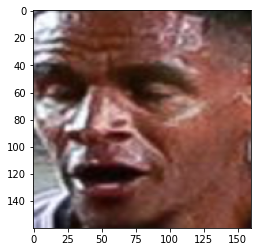

In [ ]:
plt.imshow(X_train[0])
print(trainX[0])

# DBSCAN Clustering on embeddings

In [ ]:
import sklearn.cluster as cluster
from sklearn.cluster import DBSCAN
from sklearn import metrics

In [ ]:
y_pred = DBSCAN(eps=0.3, min_samples=10).fit_predict(trainX)

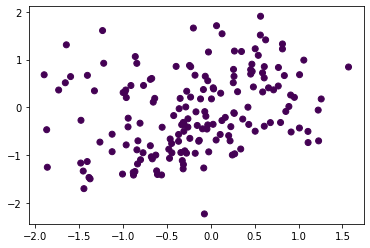

In [ ]:
plt.scatter(trainX[:,0], trainX[:,1], c=y_pred)

# TSNE Clustering (t-distributed stochastic neighbor embedding)

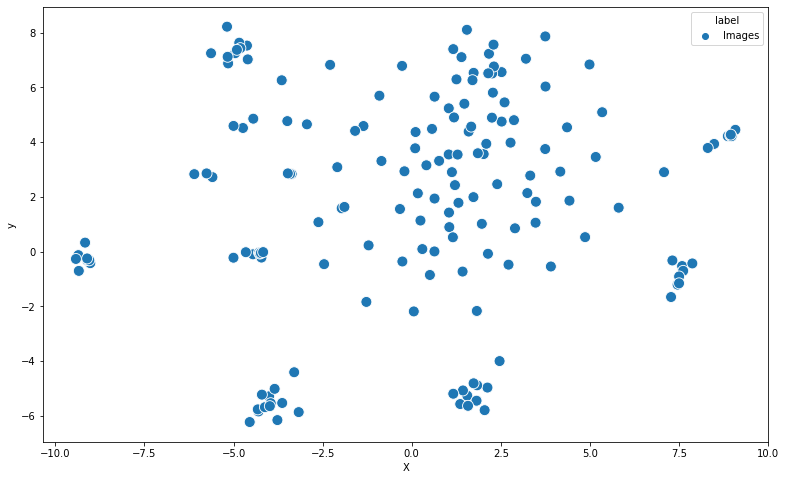

In [ ]:
from sklearn.manifold import TSNE
import seaborn as sns

tsne = TSNE(learning_rate=100)

tsne_features = tsne.fit_transform(trainX)

X = tsne_features[:,0]
y = tsne_features[:,1]

dataset = pd.DataFrame(data=y_train, columns=['label'])
dataset['X'] = X
dataset['y'] = y


plt.figure(figsize=(13,8))
sns.scatterplot(data=dataset, x='X', y='y', hue='label', s=120)